# Generating Eeveelution Point Clouds With Point Set Generation Network
### Starter Project by Vadim Kudlay

This project is made in response to the following starter project option with some slight modifications: 

> **Generate your own dataset of 3D shapes and train a neural network to generate them.**
Skills demonstrated: 3D deep learning, data wrangling, 3D geometry
This is akin to the first project, but a bit more involved: instead of classifying two types of procedural shapes, you should write a procedure that generates just one type of procedural shape and then train a deep generative model to mimic the behavior of this procedural model. There are many possible 3D generative architectures you could go with: 3DCNNS, point set generating networks, or implicit field generators are good places to start.

I thought the previous project on making a PokéGAN was pretty fun, so I wanted to use a set of related Pokémon for the project. For those unfamiliar with Pokémon, Eevee is a normal-type Pokémon species introduced in the first generation of the franchise. It is famous for having a lot of evolutions, or "Eeveelutions," with different elemental types (i.e. Flareon is a fire type evolved up using a fire stone, Vaporeon is water, etc.). They are all pretty similar in design and can be considered a logical class both in body shape and otherwise. 

I have retrieved copies of the models used in Pokemon X/Y (Nintendo, 2013) and would like to create a network that can be trained to generate them. To do this, I use one of the approaches discussed in [Learning Representations and Generative Models for 3D Point Clouds (Achlioptas et al. 2018)](https://arxiv.org/pdf/1707.02392.pdf) for learning and generating point cloud representations of 3D models. This is mostly done because, honestly, it looked relatively simple and also because I couldn't get a good grasp of dealing with voxelized components in pyMesh to the extent as was necessary to replicate [the IM-NET implicit field decoder experiments](https://arxiv.org/abs/1812.02822).

I was slightly limited in the libraries I have access to since I am using an M1 Mac, but I was able to do just fine with TensorFlow 2.5 and pyMesh.

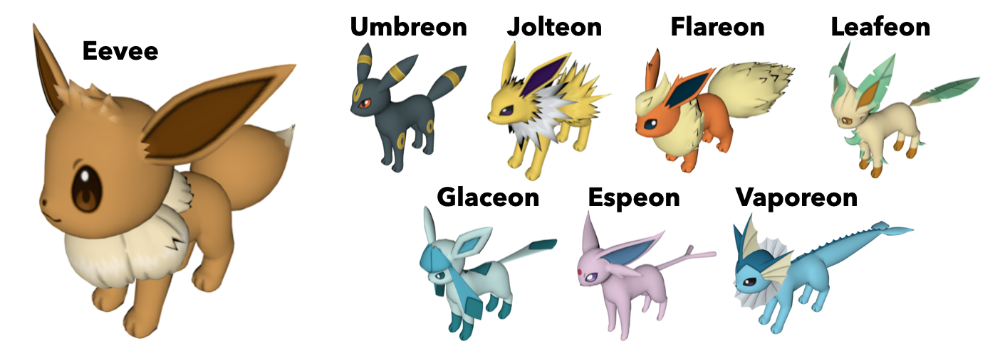

In [1]:
import sys
import os

import copy
import random 
from importlib import reload
from functools import partial
from collections import defaultdict

import numpy as np

import tensorflow as tf
import tensorflow.keras
import tensorflow.keras.backend as K
import scipy
import random

import pymesh

import matplotlib as mpl
import matplotlib.pyplot as plt

print(f"Tensorflow Version: {tf.__version__}")
print(f"Keras Version: {tensorflow.keras.__version__}")
print()
print(f"Python {sys.version}")
print(f"Pymesh {pymesh.version.__version__}")
gpu = len(tf.config.list_physical_devices('GPU')) > 0
print("GPU is", "available" if gpu else "NOT AVAILABLE")

Init Plugin
Init Graph Optimizer
Init Kernel
Tensorflow Version: 2.5.0
Keras Version: 2.5.0

Python 3.9.6 | packaged by conda-forge | (default, Jul 11 2021, 03:35:11) 
[Clang 11.1.0 ]
Pymesh 0.3
GPU is available


# Premise

For this project, we would like to create a generator that generates Eeveelutions. As such, we need to get some models for those. The models below have been sourced from [Models-Resource.com](https://www.models-resource.com/3ds/pokemonxy/) for non-commercial use and have been converted to non-textured OBJ files.

We have defined most of our utilities in auxiliary files so that we don't clutter up the notebook. Below is a quick demonstration of how to visualize some of the components that we will be interested in.

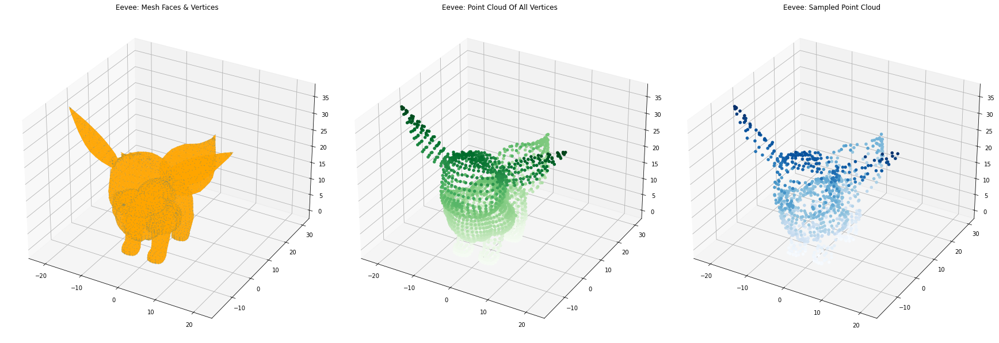

In [2]:
from utils.mesh_ops import plot_mesh_verts, sample_pointcloud, to_pointcloud, plot_pointfield
fig, axs = plt.subplots(1, 3, figsize=(24, 14), subplot_kw={'projection': '3d'}, constrained_layout=True)    

pic_dir = 'objs'
mesh = pymesh.load_mesh(f'{pic_dir}/Eevee.obj')
mesh_smpl_pc = sample_pointcloud(mesh, 2**10) 

axs[0].set_title("Eevee: Mesh Faces & Vertices")
axs[1].set_title("Eevee: Point Cloud Of All Vertices")
axs[2].set_title("Eevee: Sampled Point Cloud")

plot_mesh_verts(mesh, axs[0])
plot_pointfield(mesh, axs[1])
plot_pointfield(mesh_smpl_pc, axs[2], cmap='Blues')

For our consideration, we are going to use the following models located in `/data/objs`. Of note, I did not use [Sylveon](https://www.models-resource.com/3ds/pokemonxy/model/8122/) because 9 is a weird number unless we go with a 3x3 grid and also because I do not expect the t-posing ribbon-arms to be interesting to look at.

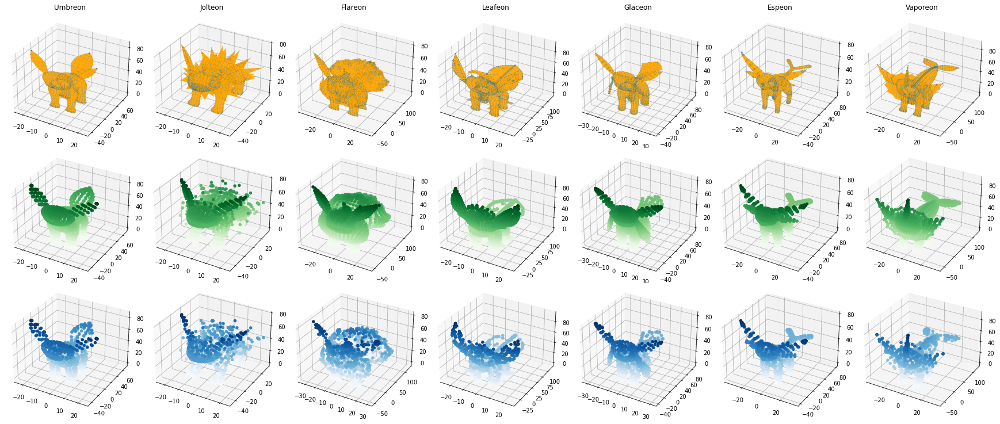

In [3]:
from utils.mesh_ops import to_pointcloud

fig, axs = plt.subplots(3, 7, figsize=(24, 10), subplot_kw={'projection': '3d'}, constrained_layout=True)    
i = -1
for filename in os.listdir(pic_dir):
    if filename.lower().endswith(".obj") and filename != 'Eevee.obj': 
        i += 1
        fbase = filename.split(".")[0]
        axs[0][i].set_title(fbase)
        
        mesh = pymesh.load_mesh(f'{pic_dir}/{filename}')
        mesh_pc = to_pointcloud(mesh)
        mesh_smpl_pc = sample_pointcloud(mesh_pc, 2**10) 
        
        plot_mesh_verts(mesh, axs[0][i])
        plot_pointfield(mesh_pc, axs[1][i])
        plot_pointfield(mesh_smpl_pc, axs[2][i], cmap='Blues')

To get a more even sample of the points, we will voxelize the meshes with a conservative precision and sample from the voxel vertices. We'll go ahead and create some convenient sample stashes for quick reference. Of course we'll have to generate more samples later, but we will not need to re-pull or re-voxelize the images throughout the process (unless we want to re-voxelize at different precisions to get even more point variation, which I don't think will be necessary).

In [4]:
from utils.mesh_ops import voxelize

vox_prec = 128  # Precision of the generated voxelizations
nsamp = 2**10   # Number of points to use per point cloud sample

raw_dict = {
    filename[:-4] : pymesh.load_mesh(f'{pic_dir}/{filename}')
        for filename in os.listdir(pic_dir) if filename.lower().endswith(".obj")
}

vox_dict = {k : voxelize(v, vox_prec) for k,v in raw_dict.items()}

print("Finished voxelizing meshes")

samp_dict = {k : sample_pointcloud(v, nsamp) for k,v in vox_dict.items()}
ex_key = list(raw_dict.keys())[0]

Finished voxelizing meshes


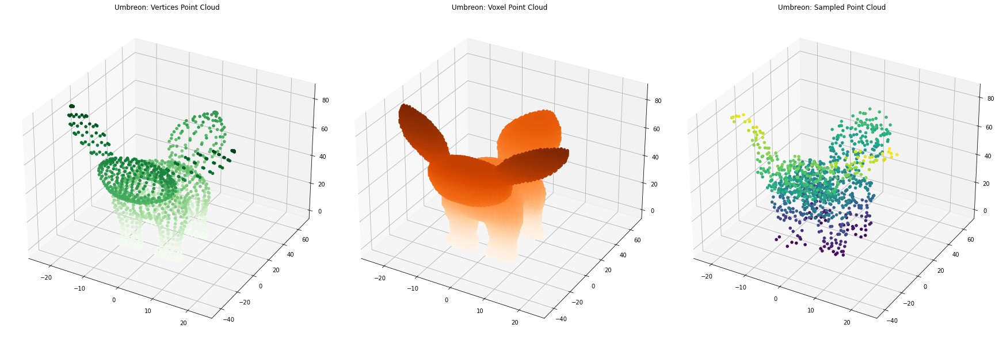

In [5]:
fig, axs = plt.subplots(1, 3, figsize=(24, 14), subplot_kw={'projection': '3d'}, constrained_layout=True)    

axs[0].set_title(f"{ex_key}: Vertices Point Cloud")
axs[1].set_title(f"{ex_key}: Voxel Point Cloud")
axs[2].set_title(f"{ex_key}: Sampled Point Cloud")
plot_pointfield(raw_dict[ex_key], axs[0])
plot_pointfield(vox_dict[ex_key], axs[1], cmap='Oranges')
plot_pointfield(samp_dict[ex_key], axs[2], cmap='viridis')

To augment the dataset, we will define an augmentation function which is capable of rotating and scaling the vertices. This will also always map to the [0,1] unit space. For convenience, we will not define an inverse transformation function because we can easily reason on the compacted scale.

Of note, we will not be using the scaling and rotating functionality at all (which is unfortunate since I already put it in) and will just be using it to scale down to unit space. Forming good transformation-invariant features seems to be out of reach given my compute limitations.

Some random point augmentations


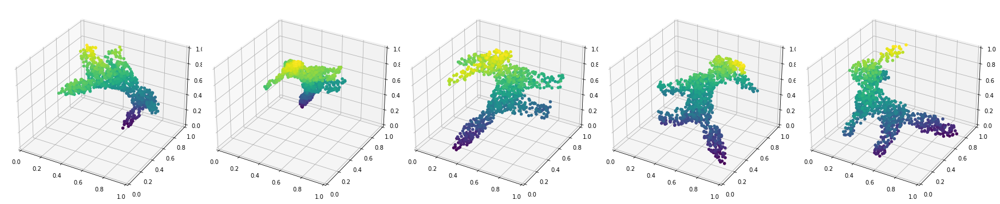

In [6]:
from utils.mesh_ops import augment_verts

fig, axs = plt.subplots(1, 5, figsize=(24, 14), subplot_kw={'projection': '3d'}, constrained_layout=True)    
[ax.set(**{f'{d}lim3d':[0,1] for d in 'xyz'}) for ax in axs]

for i, aug in enumerate(augment_verts(vox_dict[ex_key], nsamp, 5)):
    plot_pointfield(aug, axs[i], cmap='viridis')

print("Some random point augmentations")

We will now define a testing and validation dataset... which we will never use for its intended purpose. Instead, we will use a generating function which will generate new augmented samples automatically. We'll keep DS in there just because it's easy - if unnecessary - to pull from the "validation set" for some preprocessed inputs for our visualizations. 

In [7]:
DS = {'train' : [], 'valid' : []}

ntrain_pc = 50  # Number of trainign point clouds per mesh category   [not used much]
nvalid_pc = 3   # Number of validation point clouds per mesh category [not used much]

for lab, vox in vox_dict.items():
    DS['train'] += [(verts, lab) for verts in augment_verts(vox, nsamp, ntrain_pc)]
    DS['valid'] += [(verts, lab) for verts in augment_verts(vox, nsamp, 1, rotate=False, min_scale=1)]

def train_gen(ntrain_pc, batch_size):
    '''Basic train generator
    :param ntrain_pc  : How point clouds to generate per category
    :param batch_size : How many batches to split the data into
    Returns tuple 
    '''
    seed = tf.random.uniform(shape=(), minval=0, maxval=1000, dtype=tf.int64)
    ds, dk = [], []
    for i, v in enumerate(vox_dict.values()):
         # One-hot encoding of label in dk as well as vertices in ds
        ds.extend(augment_verts(v, nsamp, ntrain_pc, rotate=False, min_scale=1))
        dk.extend([[int(i == j) for j in range(len(vox_dict))] for _ in range(ntrain_pc)]) 
    buf_size = ntrain_pc * len(vox_dict)
    out1 = tf.data.Dataset.from_tensor_slices(ds).shuffle(buf_size, seed=seed).batch(batch_size)
    out2 = tf.data.Dataset.from_tensor_slices(dk).shuffle(buf_size, seed=seed).batch(batch_size)
    return (out1, out2)

We will also create a convenient visualization function to see the execution of the model while it is running. Don't worry if this looks out of place; it really just goes along with the respective model code in terms of structure, but I wanted it to be handled by the logging class and also wanted easy plotting re-specification in the notebook. 

In [8]:
def ed(x): 
    """Shorthand for expanding dimensions to shape model inputs"""
    return tf.expand_dims(x, axis=0)

def vis_save_custom(models, test_samples, epoch, step, out_path):
    """Helper function to plot some sample generated images"""
    model, encoder, decoder = models
    
    static_goal, static_glab = test_samples[0]
    static_pred = encoder(ed(static_goal))
    random_zval = tf.random.uniform(shape=static_pred.shape)
    static_pred = decoder(static_pred)[0]
    random_pred = decoder(random_zval)[0]
    
    augment_goal = augment_verts(static_goal, nsamp, 1)[0]
    augment_pred = model(ed(augment_goal))[0]
    
    fig = plt.figure(figsize=(24, 14), constrained_layout=True)
    gs = fig.add_gridspec(4, 8)
    axs = [
        [fig.add_subplot(gs[:2, i:i+2], projection = '3d') for i in range(0, 8, 2)],
        [fig.add_subplot(gs[2, i], projection = '3d') for i in range(8)],
        [fig.add_subplot(gs[3, i], projection = '3d') for i in range(8)]
    ]
    [[ax.set(**{f'{d}lim3d':[0,1] for d in 'xyz'}) for ax in axc] for axc in axs]
    
    plot_pointfield(static_goal,  axs[0][0], cmap='viridis')
    plot_pointfield(static_pred,  axs[0][1], cmap='viridis')
    plot_pointfield(random_pred,  axs[0][2], cmap='magma')
    plot_pointfield(augment_goal, axs[0][3], cmap='cividis', a=0.2)
    plot_pointfield(augment_pred, axs[0][3], cmap='coolwarm')
    axs[0][0].set_title(f'Static Sample Input: {static_glab}')
    axs[0][1].set_title(f'Static Sample Output: {static_glab}')
    axs[0][2].set_title(f'Random Uniform Z Output')
    axs[0][3].set_title(f'Static Augmented Sample: {static_glab}')
    
    for i,(verts, k) in enumerate(test_samples):
        plot_pointfield(verts, axs[2][i], cmap='cool')
        axs[2][i].set_title(k)
        verts_pred = model(ed(verts))[0]
        plot_pointfield(verts_pred, axs[1][i], cmap='winter')

    fig.suptitle(f'epoch: {epoch}')
    plt.savefig(f'{out_path}')
    plt.show()

## Running the Autoencoder

We have created an autoencoder specification in `cae.py`. We have also specified some loss functions to use, and log results in an auto-generated directory corresponding the the `StatusTracker` name. A rudementary checkpoint system is in place to where hopefully the model training can be resumed if something *unfortunate* happens. It's not bullet-proof, but I guess it's better than nothing...

The model specifications found in `AE_DefaultModel` reflect a best-effort attempt to replicate the structure in the paper. As you may have seen earlier, we will only be using 1024 point samples for our model instead of the recommended 2048. This is for the sake of compute time, since I would not like for these models to run for too long. The architecture has been compensated to reflect this (see `AE_DefaultModel` implementation).

The loss function used is based on Chamfer distance as specified in the paper (sources cited in code):
$$\mathcal{L}_{CH} = \sum_{x \in X}\min_{y \in h(X)}||x-y||^2_2 + \sum_{y \in h(X)}\min_{x \in X}||x-y||^2_2$$

In [9]:
from utils.status_tracker import StatusTracker
import models.cae        as cae
import models.model_bank as model_bank
import models.losses     as losses

n_botl = 128

ae_model_spec = model_bank.AE_DefaultModel(n_botl, nsamp)
model_name = 'ae_final_model'

my_ae = cae.AE(
    encoder_model = ae_model_spec.encoder_model,
    decoder_model = ae_model_spec.decoder_model,
    name = model_name
) 

Metal device set to: Apple M1
Encoder Structure:
Model: "enc_ae_final_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 1024, 3)]         0         
_________________________________________________________________
enc_conv_1 (Conv1D)          (None, 1024, 64)          256       
_________________________________________________________________
enc_maxp_1 (MaxPooling1D)    (None, 512, 64)           0         
_________________________________________________________________
enc_bn_1 (BatchNormalization (None, 512, 64)           256       
_________________________________________________________________
enc_conv_2 (Conv1D)          (None, 512, 128)          8320      
_________________________________________________________________
enc_maxp_2 (MaxPooling1D)    (None, 256, 128)          0         
_________________________________________________________________

2021-08-06 10:02:09.700264: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2021-08-06 10:02:09.700338: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Below is a training run of the model. I have already trained it up to epoch 400. The reason for training up to 400 is to keep the time commitment reasonable and also because the marginal benefit gets pretty bad after a certain point (from experimentation). I can believe the paper when is recommends 1000+ epochs, but I've had to rerun this experiment quite a few times to play around with the settings, so 400 is a more manageable number. Also, the batch size and number of point clouds generated per category have been reduced to 20 in both cases. This is to limit resource use and since the benefit seems to be marginal from past runs. 

Training to 400 epochs using my code generates a lot of output by default, so I will leave the code in and only show the last epoch of training. More visualizations can be found in the associated log folder. 

Start of epoch 400........
Epoch: 400 | mean loss = 1.79280972	( CMF : 1.7928 )


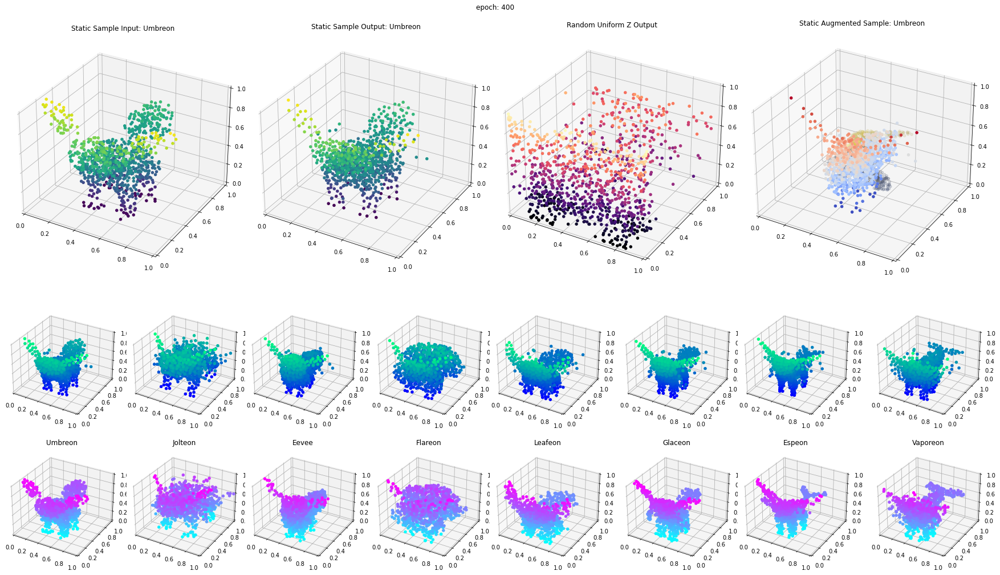

In [10]:
my_ae.train(
    train_set = partial(train_gen, ntrain_pc = 20, batch_size = 20),
    epochs = 400,
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.0005),
    losses = {'CMF' : losses.chamfer_loss},
    test_samples = DS['valid'],
    stat_tracker = StatusTracker(
        model_name, 
        vis_save_fn = vis_save_custom, 
        vis_interval = 5,
        checkpoint_interval = 0  # do not checkpoint these runs. These are just for show
    ),
    load_cp = True
)

From this model, a specific preprocessed example can be encoded and decoded as follows: 

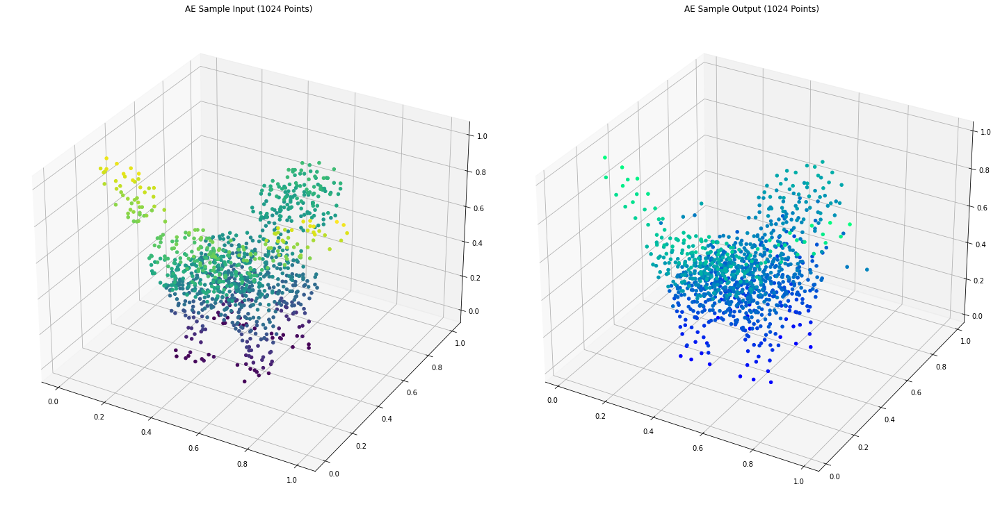

In [11]:
sample_input = DS['valid'][0][0]
sample_output = my_ae.model(ed(sample_input))

fig, axs = plt.subplots(1, 2, figsize=(20, 10), subplot_kw={'projection': '3d'}, constrained_layout=True)    

axs[0].set_title('AE Sample Input (1024 Points)')
axs[1].set_title('AE Sample Output (1024 Points)')

plot_pointfield(sample_input, axs[0], cmap='viridis')
plot_pointfield(sample_output.numpy()[0], axs[1], cmap='winter')

Though possibly redundant given the visualizations coming out of the training loop, below are all of the classes and the model's attempt at reconstructing them through the bottleneck. Here, it will include the original vertices from the voxelization, a cluster of five 1024-point input examples, their corresponding predictions, and the predictions of just the first sample (for comparison). 

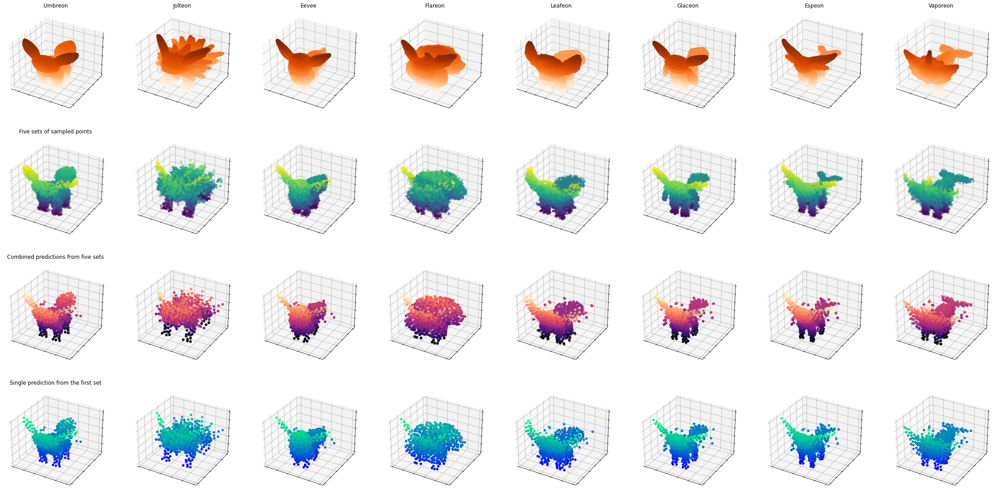

In [12]:
sample_input = DS['valid'][1][0]
sample_output = my_ae.model(ed(sample_input))

fig, axs = plt.subplots(4, len(vox_dict.keys()), figsize=(40, 20), subplot_kw={'projection': '3d'})    

axs[1][0].set_title('Five sets of sampled points')
axs[2][0].set_title('Combined predictions from five sets')
axs[3][0].set_title('Single prediction from the first set')

for i, lab in enumerate(vox_dict.keys()):
    [ax[i].set_xticklabels([]) for ax in axs]
    [ax[i].set_yticklabels([]) for ax in axs]
    [ax[i].set_zticklabels([]) for ax in axs]
    axs[0][i].set_title(lab)
    plot_pointfield(vox_dict[lab],  axs[0][i], cmap='Oranges')
    for j, samp_verts in enumerate(augment_verts(vox_dict[lab], nsamp, 5, rotate=False, min_scale=1)): 
        pred_verts = my_ae.model(ed(samp_verts)).numpy()[0]
        plot_pointfield(samp_verts, axs[1][i], cmap='viridis', a=0.5)        
        plot_pointfield(pred_verts, axs[2][i], cmap='magma', a=0.5)
        if j == 0: 
            plot_pointfield(pred_verts, axs[3][i], cmap='winter')

As we can see from visual inspection, the generated images don't actually vary much. This uses some pretty thick points, but we can see from landmark points that the point distributions between the combined- and single-prediction plots are pretty much identical. This is to be expected, as the network was supposed to high-level attributes from the point cloud samples, transfer them through the bottleneck, and reconstruct an output based on them. 

# Training the $\ell$-Gan

The paper discussed several techniques for generating convincing images from random noise. One such technique was to train a GAN (generative adversarial network) on the latent bottleneck features of the autoencoder. In doing so, it can learn to generate good latent features within a tighter specification (relative to just throwing in random latent features and hoping they work well for the decoder). I'm not really sure why another autoencoder couldn't have been used, but I might as well replicate it for practice.

Below, we define the visualization function and a modified generator for the training examples (which just piggybacks from the previous generator): 

In [13]:
def vis_save_gan(models, test_samples, epoch, step, out_path):
    """Helper function to plot some sample generated images of lgan. Assumes n_input == 2"""
    generator, descriminator = models    
    res = 5    
    fig, axs = plt.subplots(res, res, figsize=(20, 20), subplot_kw={'projection': '3d'}, constrained_layout=True)    
    for i, x in enumerate(np.linspace(0, 1, res)):
        for j, y in enumerate(np.linspace(0, 1, res)):
            gen_lats = generator(tf.constant([[x, y]]))
            gen_verts = my_ae.decoder(gen_lats)[0].numpy()
            plot_pointfield(gen_verts, axs[i][j], cmap='viridis')
    
    fig.suptitle(f'epoch: {epoch}')
    plt.savefig(out_path)
    plt.show()
    
def train_gen_gan(ntrain_pc, batch_size):
    """Train generator for gan datapoints; similar to previous version"""
    out1, out2 = train_gen(ntrain_pc, batch_size)
    out1 = [my_ae.encoder(out) for out in out1]
    return (out1, out2)

### Running The Model

The paper specifically recommended a [WGAN](https://arxiv.org/abs/1701.07875) implementation with a very shallow architecture. Note that for the purposes of generality, I do occasionally label the generator-apposing network as 'descriminator' instead of 'critic'; I do acknowlege that critic is a more accurate term given its purpose. I used a WGAN-GP gradient penalty to enforce a Lipschitz constraint on the critic as recommended, the code for which I repurposed from the Coursera course [Generative Deep Learning with TensorFlow (DeepLearning.AI)](https://www.coursera.org/learn/generative-deep-learning-with-tensorflow) - specifically from [this notebook](https://colab.research.google.com/drive/1zAUGSNFENZ_iU7m8YkiniG8seUNqbYT5#scrollTo=gKNwOru-2_Vb) - because it allows easy switching to the DRAGAN gradient penalty in case we need it.

I attempted to follow the instructions per the paper and implemented it using a small number of dense layers instead of convolutional layers (I'm not sure if that's the best idea, but I'm just going with it). Some slight deviations were made for the sake of runtime. Specifically, I implemented the generator $g$ and critic $c$ as follows:

- The generator model $g$ has two dense layers (both 128 layers) which generates a latent representation from an arbitrary number of input features. The model uses loss $\mathcal{L}_G = 1 - \mathbb{E}(c(g(z)))$ where $z$ is random noise in the shape of the real training data.

- The critic model $c$ has two dense layers (256 and 512 neurons respectively) with standard ReLU activations, the results of which are combined and sigmoided for a probability of authenticity between 0 and 1. The model uses loss $\mathcal{L}_C = 1 - \mathbb{E}(c(x)) + \mathbb{E}(c(g(z))) + \lambda\mathbb{E}(||\nabla c(\hat{x})||_2 - 1)$ where $x$ is the set of real training data and last term is the WGAN gradient penalty as mentioned previously.

The two models will be trained in lockstep and once per epoch, though this can be specified using the `train_counts` parameter.

In [14]:
import models.gan as gan

n_botl  = 128
n_input = 2    # how many input features to LGAN
lgan_model_name = 'lgan_final_model'

lgan_models = model_bank.LGAN_DefaultModel(n_botl, nsamp, n_input)
my_gan = gan.LGAN(
    gen_model = lgan_models.gen_model,
    dis_model = lgan_models.dis_model,
    name = lgan_model_name
) 

Generator Structure:
Model: "gen_model_lgan_final_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 2)]               0         
_________________________________________________________________
gen_dense_0 (Dense)          (None, 128)               384       
_________________________________________________________________
gen_dense_1 (Dense)          (None, 128)               16512     
Total params: 16,896
Trainable params: 16,896
Non-trainable params: 0
_________________________________________________________________
Discriminator Structure:
Model: "dis_model_lgan_final_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 128)]             0         
_________________________________________________________________
dis_dense_0 (Dense) 

Again, we will pre-run the training to keep the notebook less verbose. More data can be found in the respective log file. As the GAN takes in 2 features as input, the output shows what happens as the two features vary in increments of 0.25.

Start of epoch 400........
Epoch: 400 | mean loss = 0.70655286	( BCE_D : 0.38949 | BCE_G : 0.30846 | WGAN-GP : 0.0086064 )


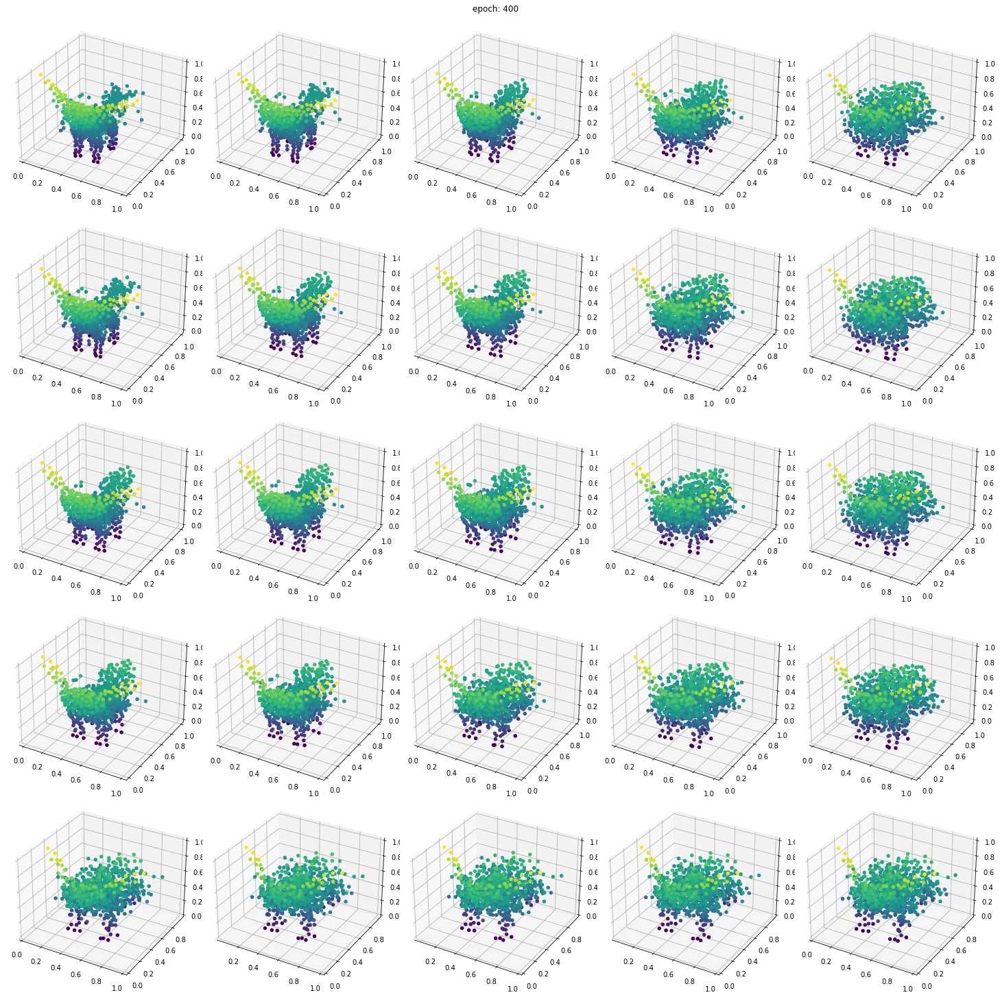

In [15]:
my_gan.train(
    train_set = partial(train_gen_gan, ntrain_pc = 64, batch_size = 64),
    epochs = 400, 
    optimizers = [tf.keras.optimizers.Adam(learning_rate=0.002) for _ in range(2)],
    losses = [
        {'BCE_D' : losses.dis_loss}, 
        {'BCE_G' : losses.gen_loss}, 
    ],
    test_samples = DS['valid'],
    stat_tracker = StatusTracker(
        lgan_model_name,
        vis_save_fn = vis_save_gan, 
        vis_interval = 25,
        checkpoint_interval = 0
    ),
    gp_mode = 'wgan-gp',
    gp_weight = 100,
    train_counts = (1, 1),
    load_cp = True
)

As we can see, the GAN was able to train up to generate a selection of valid latent inputs using only 2 input features to represent 4 image categories. I guess that means that it works? I'm sure it could be trained up to generate on a wider output range (and adding another dimension to the GAN input space would probably help), but I don't think it would be necessary for this exercise. 

# Using a Variational Autoencoder

The paper suggested that a VAE would not work as well in the general case due to over-regularization. Still, I wanted to go ahead and try it out. I tried to keep the overall structure pretty simple to keep it in line with the AE for comparison (and to save running time for replication), so I kept the number of trainable parameters below 10 million. I tried using convolutional layers on both sides 

As before, here is the visualization function:

In [16]:
# def vis_save_vae_custom(models, test_samples, epoch, step, out_path):
#     """Helper function to plot some sample generated images"""
#     model, encoder, decoder = models
    
#     static_goal, static_glab = test_samples[0]
#     static_pred = encoder(ed(static_goal))[0]
#     random_zval = tf.random.uniform(shape=static_pred.shape)
#     static_pred = decoder(static_pred)[0]
#     random_pred = decoder(random_zval)[0]
    
#     augment_goal = augment_verts(static_goal, nsamp, 1)[0]
#     augment_pred = model(ed(augment_goal))[0]
    
#     fig = plt.figure(figsize=(24, 14), constrained_layout=True)
#     gs = fig.add_gridspec(4, 8)
#     axs = [
#         [fig.add_subplot(gs[:2, i:i+2], projection = '3d') for i in range(0, 8, 2)],
#         [fig.add_subplot(gs[2, i], projection = '3d') for i in range(8)],
#         [fig.add_subplot(gs[3, i], projection = '3d') for i in range(8)]
#     ]
#     [[ax.set(**{f'{d}lim3d':[0,1] for d in 'xyz'}) for ax in axc] for axc in axs]
    
#     plot_pointfield(static_goal,  axs[0][0], cmap='viridis')
#     plot_pointfield(static_pred,  axs[0][1], cmap='viridis')
#     plot_pointfield(random_pred,  axs[0][2], cmap='magma')
#     plot_pointfield(augment_goal, axs[0][3], cmap='cividis', a=0.2)
#     plot_pointfield(augment_pred, axs[0][3], cmap='coolwarm')
#     axs[0][0].set_title(f'Static Sample Input: {static_glab}')
#     axs[0][1].set_title(f'Static Sample Output: {static_glab}')
#     axs[0][2].set_title(f'Random Normal Z Output')
#     axs[0][3].set_title(f'Static Augmented Sample: {static_glab}')
    
#     for i,(verts, k) in enumerate(test_samples):
#         plot_pointfield(verts, axs[2][i], cmap='cool')
#         axs[2][i].set_title(k)
#         verts_pred = model(ed(verts))[0]
#         plot_pointfield(verts_pred, axs[1][i], cmap='winter')

#     fig.suptitle(f'epoch: {epoch}')
#     plt.savefig(f'{out_path}')
#     plt.show()

### Trying The Model

Below is the instantiation of the model. We will use just a basic variational autoencoder with normally-distributed sampling. We will not do anything special like disentangling or including any special loss terms. 

Specifically the model consists of: 
- An encoder with two 1D convolutional layers, each followed by a max pooling layer and a batch normalization layer. The convolutions use single-stride to try to consider the points individually. To keep the network simple (as said before) the layers use 8 and 16 filters, respectively. Finally, two dense layers are used, one to generate the feature means and the other to generate the feature deviations; these are used to parameterize a 128-feature normal distributions to generate the latent values in the bottleneck. 
- A decoder starts with a dense + reshape layer to generate a set of 48 3D 'latent points'. This is followed by two 1D conv transpose layers, each followed by an upsampling layer and a batch normalization layer. This upsamples back to the original sample shape. For the sake of symmetry and also to keep the network simple, the layers use 16 and 8 filters respectively. Finally, a dense + reshape layer with sigmoid activation is used to generate final prediction points in [0,1].

As before, the Chamfer distance loss function will be used for the reconstruction loss and 400 epochs will be used to train the network. For the reconstruction loss we will use the [Kullback–Leibler (KL) divergence loss](https://en.wikipedia.org/wiki/Kullback–Leibler_divergence#Multivariate_normal_distributions) - specifically, [a variation (equation 10)](https://arxiv.org/pdf/1312.6114.pdf) as described in the DeepLearning.ai course - on the means $\mu$ and deviations $\sigma$:
$$\mathcal{L}_{KLD} = \frac{1}{2}\sum_{i}(1 + \ln(\sigma_i^2) - \mu_i^2 - \sigma_i^2)$$

Note that since the code uses variance, the following modified internal function are actually used: $1 + \sigma_i - \mu_i^2 - e^{\sigma_i}$.

In [17]:
# import models.model_bank
# import models.cvae as cvae

# n_botl = 128
# vae_model_name = 'vae_trial_model'

# vae_models = model_bank.VAE_DefaultModel(n_botl, nsamp)
# my_vae = cvae.VAE(
#     encoder_model = vae_models.encoder_model,
#     decoder_model = vae_models.decoder_model,
#     name = vae_model_name
# ) 

# my_vae.train(
#     train_set = partial(train_gen, ntrain_pc = 20, batch_size = 20),
#     epochs = 400, 
#     optimizer = tf.keras.optimizers.Adam(learning_rate=0.0005),
#     losses = {'CMF' : losses.chamfer_loss, 'KLR' : losses.kl_loss},
#     test_samples = DS['valid'],
#     stat_tracker = StatusTracker(
#         vae_model_name, 
#         vis_save_fn = vis_save_vae_custom, 
#         vis_interval = 20,
#         checkpoint_interval = 1
#     ),
#     load_cp = True
# )

I just wanted to mention that I did try it. At the end of the day, I'm not going to include the results since it ended up converging much slower and didn't seem to approach the same level of reconstruction quality within a reasonable epoch count (at least for my setup). It *did* train fast and generate really nice reconstructions when only using the reconstruction loss and the resulting mean/variance encodings could be interpolated between for nice class transitions on decoding. Still, using this would largely deplete the benefit of "just give a random normal latent vector of the right shape and it'll be fine" allure. 

# Interpolating between class samples

I thought that it would be interesting to see how the network would perform when we asked it to transition from one image category to another. In the case of the AE model, it would be to translate between latent representations using a strategy such as euclidean straight-line.

### Autoencoder

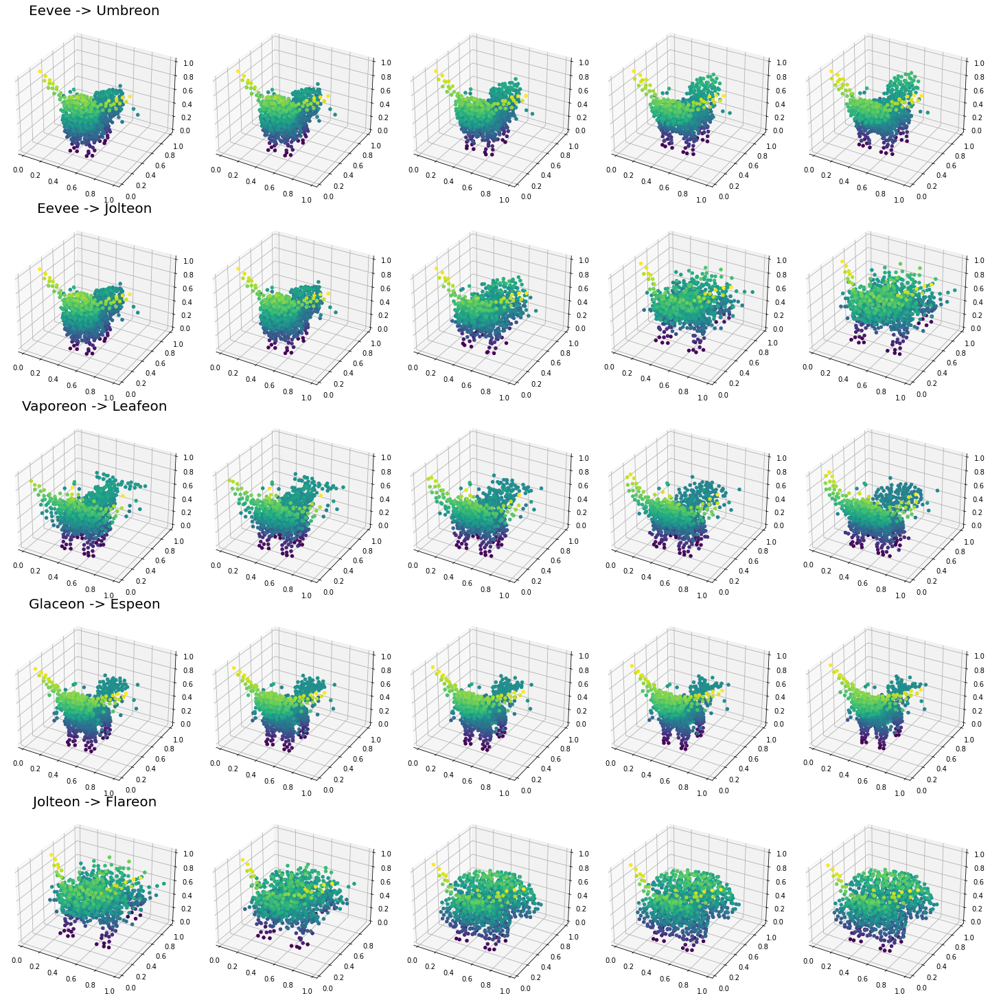

In [18]:
from random import sample

encoder = my_ae.encoder
decoder = my_ae.decoder

latent_pms = {k : encoder(ed(v)) for v, k in DS['valid']} # latent distribution parameters

nrow, ncol = 5, 5
fig, axs = plt.subplots(nrow, ncol, figsize=(20, 20), subplot_kw={'projection': '3d'}, constrained_layout=True)    

lab_pairs = zip(
    ['Eevee',   'Eevee',   'Vaporeon', 'Glaceon', 'Jolteon'],
    ['Umbreon', 'Jolteon', 'Leafeon',  'Espeon',  'Flareon']
)

for i, (lab1, lab2) in enumerate(lab_pairs):
    pms_ls = tf.linspace(latent_pms[lab1], latent_pms[lab2], ncol)
    axs[i][0].set_title(f'{lab1} -> {lab2}', fontsize=20)
    #pms_ls = [latent_pms[lab1], latent_pms[lab2]]
    for j, z in enumerate(pms_ls):
        pred = decoder(z)[0].numpy()
        plot_pointfield(pred, axs[i][j], cmap='viridis')

# Training an AE with Targetted Generation

I thought it would be interesting to see what would happen if instead of using an auto-encoder to reconstruct the point-clouds, I try using an auto-encoder to convert a point-cloud to a new class. Of course, doing it naively would be pretty bad, but I wanted to see what would happen. 

For a first run, I tried just to train an auto-encoder that took in an Eevee and a one-hot encoding of the target class. The origin class point-cloud was obviously passed in through the decoder, but the destination encoding was passed directly to the decoder by appending to the latent bottleneck vector; this was a design choice that I thought would possibly make the approach more flexible later. I used a similar architecture as before and just ran it to see what happened. I intentionally left the batch size and sample size very small because the results of this really won't matter. 

In [19]:
def train_gen_target_from_eevee(ntrain_pc, batch_size):
    '''Special train_gen for targetted ae (first iteration) that always outputs tuple with values:
    input  = 'Eevee' sample cloud
    label  = one-hot-encoding of target class
    output = target class sample cloud
    '''
    seed = tf.random.uniform(shape=(), minval=0, maxval=1000, dtype=tf.int64)
    d_inp, d_lab, d_out = [], [], []
    for i, (k, v) in enumerate(vox_dict.items()):
        d_inp.extend(augment_verts(vox_dict['Eevee'], nsamp, ntrain_pc, rotate=False, min_scale=1))
        d_lab.extend([[int(i == j) for j in range(len(vox_dict))] for _ in range(ntrain_pc)]) 
        d_out.extend(augment_verts(v, nsamp, ntrain_pc, rotate=False, min_scale=1))
    buf_size = ntrain_pc * len(vox_dict)
    out1 = tf.data.Dataset.from_tensor_slices(d_inp).shuffle(buf_size, seed=seed).batch(batch_size)
    out2 = tf.data.Dataset.from_tensor_slices(d_lab).shuffle(buf_size, seed=seed).batch(batch_size)
    out3 = tf.data.Dataset.from_tensor_slices(d_out).shuffle(buf_size, seed=seed).batch(batch_size)
    return (out1, out2, out3)

def vis_save_t(models, test_samples, epoch, step, out_path):
    """Helper function to plot some sample generated images"""
    model, encoder, decoder = models
    
    fig = plt.figure(figsize=(24, 14), constrained_layout=True)
    gs = fig.add_gridspec(4, 8)
    axs = [
        [fig.add_subplot(gs[0, i], projection = '3d') for i in range(8)],
        [fig.add_subplot(gs[1, i], projection = '3d') for i in range(8)]
    ]
    [[ax.set(**{f'{d}lim3d':[0,1] for d in 'xyz'}) for ax in axc] for axc in axs]
    
    for i, (inp, cat, out) in enumerate(zip(*test_samples)):
        axs[0][i].set_title("Desired")
        axs[1][i].set_title("Predicted")
        pred = model([inp, cat])[0]
        plot_pointfield(out[0], axs[0][i], cmap='cool')
        plot_pointfield(pred, axs[1][i], cmap='winter')

    fig.suptitle(f'epoch: {epoch}')
    plt.savefig(f'{out_path}')
    plt.show()

In [20]:
n_botl = 128
tae_model_name = 'tae_first_try_model'
n_cats = len(vox_dict.keys())

tae_models = model_bank.TAE_DefaultModel(n_botl, nsamp, n_cats)
my_tae = cae.TAE(
    encoder_model = tae_models.encoder_model,
    decoder_model = tae_models.decoder_model,
    name = tae_model_name
) 

Encoder Structure:
Model: "enc_tae_first_try_model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 1024, 3)]    0                                            
__________________________________________________________________________________________________
enc_conv_1 (Conv1D)             (None, 1024, 64)     256         input_5[0][0]                    
__________________________________________________________________________________________________
enc_maxp_1 (MaxPooling1D)       (None, 512, 64)      0           enc_conv_1[0][0]                 
__________________________________________________________________________________________________
enc_bn_1 (BatchNormalization)   (None, 512, 64)      256         enc_maxp_1[0][0]                 
_________________________________________________________

Start of epoch 200........
Epoch: 200 | mean loss = 1.91792297	( CMF : 1.9179 )


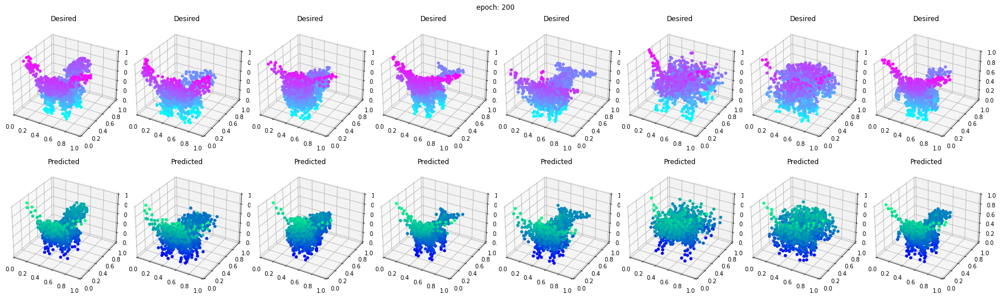

In [21]:
my_tae.train(
    train_set = partial(train_gen_target_from_eevee, ntrain_pc = 2, batch_size = 2),
    epochs = 200, 
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.0005),
    losses = {'CMF' : losses.chamfer_loss},
    test_samples = train_gen_target_from_eevee(ntrain_pc = 1, batch_size = 1),
    stat_tracker = StatusTracker(
        tae_model_name, 
        vis_save_fn = vis_save_t, 
        vis_interval = 25,
        checkpoint_interval = 0
    ),
    load_cp = True
)

We're gonna go ahead and cut the run short. This run is pretty useless, but there was benefit to running it. As you can see, the decoder could reconstruct the output from the one-hot encoder alone, as can be seen with this example when the point cloud input is switched to that of the target class:

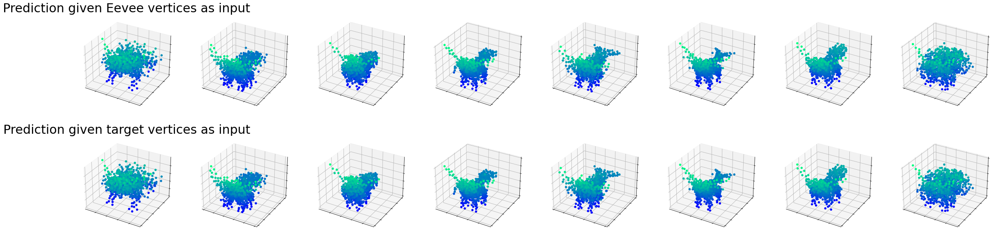

In [24]:
fig, axs = plt.subplots(2, 8, figsize=(40, 10), subplot_kw={'projection': '3d'})    

axs[0][0].set_title('Prediction given Eevee vertices as input', fontsize=30)
axs[1][0].set_title('Prediction given target vertices as input', fontsize=30)

def hide_axticks(ax):
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])

for i, (inp, cat, out) in enumerate(zip(*train_gen_target_from_eevee(ntrain_pc = 1, batch_size = 1))):
    plot_pointfield(my_tae.model([out, cat]).numpy()[0], axs[0][i], cmap='winter')
    plot_pointfield(my_tae.model([inp, cat]).numpy()[0], axs[1][i], cmap='winter')
    [hide_axticks(ax[i]) for ax in axs]

Still, this shows us that the decoder is sufficiently deep to be able to store such relationships, even if only memorizing them. 

## Specifying A More Interesting Model

From here, let us try to actually define an evolutionary behavior. We'll say that to evolve from an origin class to a destination class, the transformation feature vector will show a decrease in the origin class feature and an increase in the destination class feature. 

We will define the new generator as follows, which will now include a transformation vector. This transformation vector will have a 0 for the origin class, a 1 for the destination class, and 0.5 for all other classes.

In [42]:
def train_gen_target(ntrain_pc, batch_size):
    '''Generator that now gives a defined 'evolution' as the second output. 
    If we want a shape to transition from class 1 to class 3 (0-based), the 
    encoding would be [.5, 0, .5, 1, .5, .5, ..., .5]. 
    '''
    seed = tf.random.uniform(shape=(), minval=0, maxval=1000, dtype=tf.int64)
    d_inp, d_lab, d_out = [], [], []
    for i, (k1, v1) in enumerate(vox_dict.items()):
        for j, (k2, v2) in enumerate(vox_dict.items()):
            d_inp.extend(augment_verts(v1, nsamp, ntrain_pc, rotate=False, min_scale=1))
            d_lab.extend([
                [0.5 * (1 + (int(j == c) - int(i == c))) for c in range(len(vox_dict))] 
                    for _ in range(ntrain_pc)
            ]) 
            d_out.extend(augment_verts(v2, nsamp, ntrain_pc, rotate=False, min_scale=1))
            if j != i:  
                d_inp.extend(augment_verts(v1, nsamp, ntrain_pc, rotate=False, min_scale=1))
                d_lab.extend([[0] * len(vox_dict) for _ in range(ntrain_pc)]) 
                d_out.extend(augment_verts(v1, nsamp, ntrain_pc, rotate=False, min_scale=1))

    buf_size = ntrain_pc * len(vox_dict)
    out1 = tf.data.Dataset.from_tensor_slices(d_inp).shuffle(buf_size, seed=seed).batch(batch_size)
    out2 = tf.data.Dataset.from_tensor_slices(d_lab).shuffle(buf_size, seed=seed).batch(batch_size)
    out3 = tf.data.Dataset.from_tensor_slices(d_out).shuffle(buf_size, seed=seed).batch(batch_size)
    return (out1, out2, out3)

def vis_save_t(models, test_samples, epoch, step, out_path):
    """Helper function to plot some sample generated images"""
    model, encoder, decoder = models
    
    fig = plt.figure(figsize=(24, 14), constrained_layout=True)
    gs = fig.add_gridspec(4, 8)
    axs = [
        [fig.add_subplot(gs[0, i], projection = '3d') for i in range(8)],
        [fig.add_subplot(gs[1, i], projection = '3d') for i in range(8)],
        [fig.add_subplot(gs[2, i], projection = '3d') for i in range(8)]
    ]
    [[ax.set(**{f'{d}lim3d':[0,1] for d in 'xyz'}) for ax in axc] for axc in axs]

    for i, (inp, trf, out) in enumerate(random.sample(list(zip(*test_samples)), 5)):
        axs[0][i].set_title("Origin")
        axs[1][i].set_title("Destination")
        axs[2][i].set_title("Prediction")
        pred = model([inp, trf])[0]
        plot_pointfield(inp[0], axs[0][i], cmap='cool')
        plot_pointfield(out[0], axs[1][i], cmap='cool')
        plot_pointfield(pred, axs[2][i], cmap='winter')

    seen = set()
    for i, (inp, trf, out) in enumerate(random.sample(list(zip(*test_samples)), 3)):
        i += 5
        while str(inp) in seen:
            (inp, trf, out) = random.sample(list(zip(*test_samples)), 1)
        seen.add(str(inp))
        axs[0][i].set_title("Origin")
        axs[1][i].set_title("Destination")
        axs[2][i].set_title("Prediction")
        pred = model([inp, tf.convert_to_tensor([[0]*8])])[0]
        plot_pointfield(inp[0], axs[0][i], cmap='cool')
        plot_pointfield(inp[0], axs[1][i], cmap='cool')
        plot_pointfield(pred, axs[2][i], cmap='winter')
        
    fig.suptitle(f'epoch: {epoch}')
    plt.savefig(f'{out_path}')
    plt.show()

In [26]:
n_botl = 128
model_name = 'tae_1_final_model'
n_cats = len(vox_dict.keys())

tae_models = model_bank.TAE_DefaultModel(n_botl, nsamp, n_cats)
my_tae1 = cae.TAE(
    encoder_model = tae_models.encoder_model,
    decoder_model = tae_models.decoder_model,
    name = model_name
) 

Encoder Structure:
Model: "enc_tae_1_final_model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_8 (InputLayer)            [(None, 1024, 3)]    0                                            
__________________________________________________________________________________________________
enc_conv_1 (Conv1D)             (None, 1024, 64)     256         input_8[0][0]                    
__________________________________________________________________________________________________
enc_maxp_1 (MaxPooling1D)       (None, 512, 64)      0           enc_conv_1[0][0]                 
__________________________________________________________________________________________________
enc_bn_1 (BatchNormalization)   (None, 512, 64)      256         enc_maxp_1[0][0]                 
___________________________________________________________

Start of epoch 50..............................
Epoch: 50 | mean loss = 2.72723246	( CMF : 2.7272 )


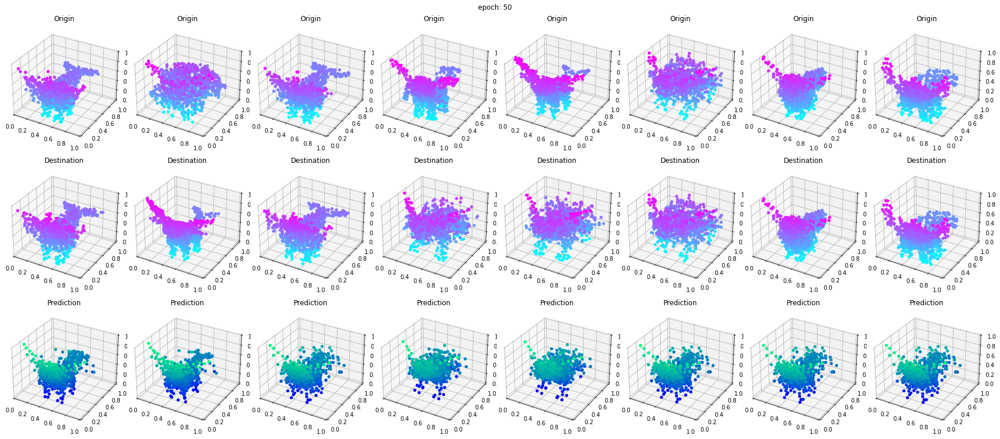

In [27]:
my_tae1.train(
    train_set = partial(train_gen_target, ntrain_pc = 2, batch_size = 8),
    epochs = 50, 
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.0005),
    losses = {'CMF' : losses.chamfer_loss},
    test_samples = train_gen_target(ntrain_pc = 1, batch_size = 1),
    stat_tracker = StatusTracker(
        model_name, 
        vis_save_fn = vis_save_t, 
        vis_interval = 10,
        checkpoint_interval = 0
    ),
    load_cp = True
)

I noticed a pretty concerning trend early on where the network learns to use only the transformation encoding to decide how the output should be. This can be seen by the fact that the identity transformations are all the same while the non-identity transformations get better. Instead of waiting to see if it became a problem, I decided to try to address this concern early on by using two techniques:
- Rebalance the dataset to have roughly half-and-half identity/non-identity transformations.
- Add an additional point of evaluation; the latent information has to propagate far into the network. My way of doing this (which does restrict the network in some sense), is to add an additional dense layer near the end of the decoder which tries to generate a reconstruction of the input. The loss associated with this reconstruction complements the loss of the other output layer that is trying to match the target class. Of note, this will be trained by reference so that the model used in the visualization can still output the same single value as expected. 

We'll have to redefine everything in `TAE2` which we will use below:

In [45]:
n_botl = 128
model_name = 'tae2_final_model'
n_cats = len(vox_dict.keys())

tae2_models = model_bank.TAE2_DefaultModel(n_botl, nsamp, n_cats)
my_tae2 = cae.TAE2(
    encoder_model = tae2_models.encoder_model,
    decoder_model = tae2_models.decoder_model,
    name = model_name
) 

Encoder Structure:
Model: "enc_tae2_final_model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_20 (InputLayer)           [(None, 1024, 3)]    0                                            
__________________________________________________________________________________________________
enc_conv_1 (Conv1D)             (None, 1024, 64)     256         input_20[0][0]                   
__________________________________________________________________________________________________
enc_maxp_1 (MaxPooling1D)       (None, 512, 64)      0           enc_conv_1[0][0]                 
__________________________________________________________________________________________________
enc_bn_1 (BatchNormalization)   (None, 512, 64)      256         enc_maxp_1[0][0]                 
____________________________________________________________

Start of epoch 400............
Epoch: 400 | mean loss = 3.71524882	( CMF_trans : 1.8636 | CMF_mimic : 1.8517 )


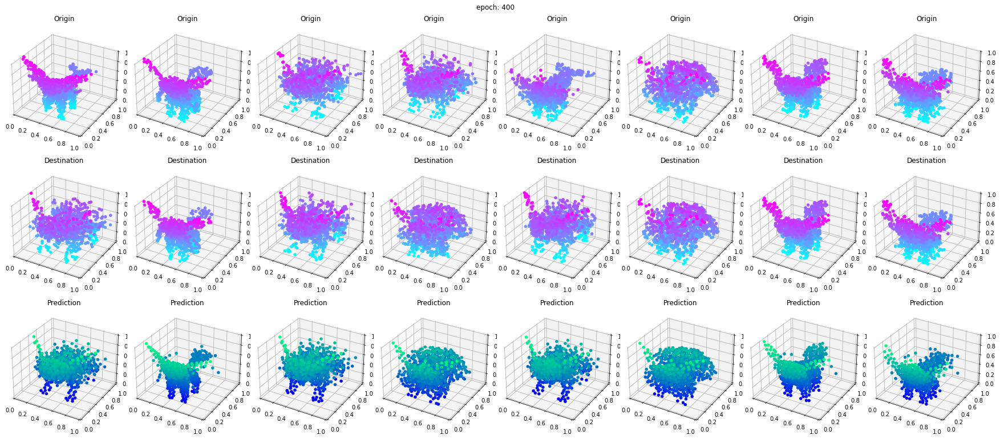

In [46]:
my_tae2.train(
    train_set = partial(train_gen_target, ntrain_pc = 2, batch_size = 20),
    epochs = 400, 
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.0005),
    losses = {'CMF' : losses.chamfer_loss},
    test_samples = train_gen_target(ntrain_pc = 1, batch_size = 1),
    stat_tracker = StatusTracker(
        model_name, 
        vis_save_fn = vis_save_t, 
        vis_interval = 10,
        checkpoint_interval = 1
    ),
    load_cp = True
)

## Playing around with the model

We're gonna take a look at the behavior to figure out what kinds of things this model managed to learn. First, we're just going to define a simple function to get the desired transformation feature vector:

In [30]:
main_model = my_tae2.model
DS_pool = {v:k for k,v in DS['valid']}
def get_tff(a, b, percent = 1):
    out = [0.5] * len(vox_dict)
    vals = list(vox_dict.keys())
    if not isinstance(a, list) and not isinstance(a, tuple): a = [a]
    if not isinstance(b, list) and not isinstance(b, tuple): b = [b]
    for v in a: out[vals.index(v)] -= percent/2 
    for v in b: out[vals.index(v)] += percent/2
    return out

def plot_transition(orig_pc, goal_tf, ax, tick_off = True):
    pred = main_model([ed(orig_pc), ed(goal_tf)])[0]
    plot_pointfield(pred, ax, cmap='viridis')
    if tick_off: 
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_zticklabels([])

Now, let's just see what happens when we progressively transition an input point-cloud to some other target classes...

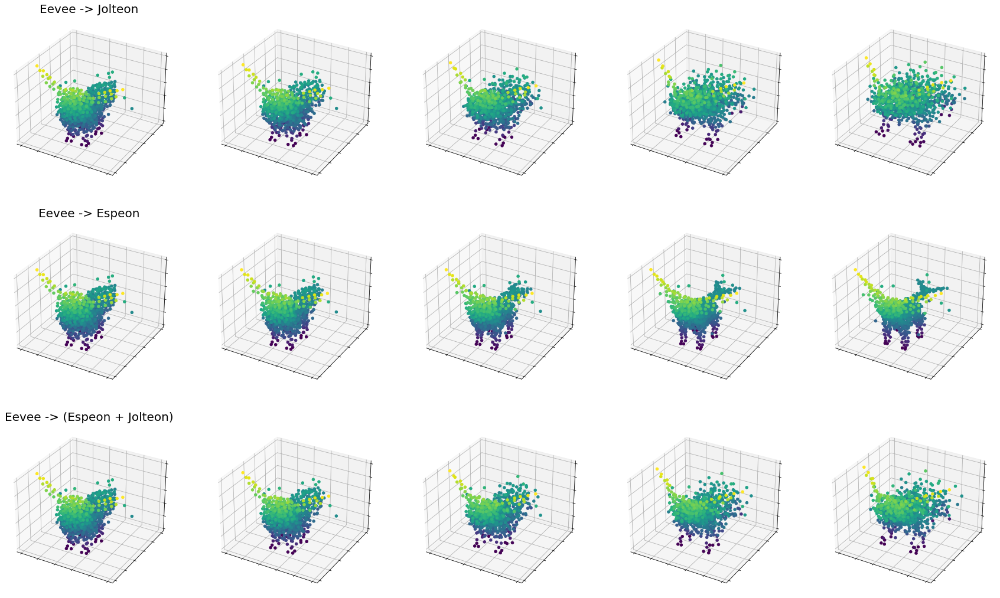

In [31]:
fig, axs = plt.subplots(3, 5, figsize=(30, 18), subplot_kw={'projection': '3d'})  
axs[0][0].set_title('Eevee -> Jolteon',            fontsize=20)
axs[1][0].set_title('Eevee -> Espeon',             fontsize=20)
axs[2][0].set_title('Eevee -> (Espeon + Jolteon)', fontsize=20)
for i in range(5):
    plot_transition(DS_pool['Eevee'], get_tff('Eevee', 'Jolteon',             i * 0.25), axs[0][i])
    plot_transition(DS_pool['Eevee'], get_tff('Eevee', 'Espeon',              i * 0.25), axs[1][i])
    plot_transition(DS_pool['Eevee'], get_tff('Eevee', ['Espeon', 'Jolteon'], i * 0.25), axs[2][i])

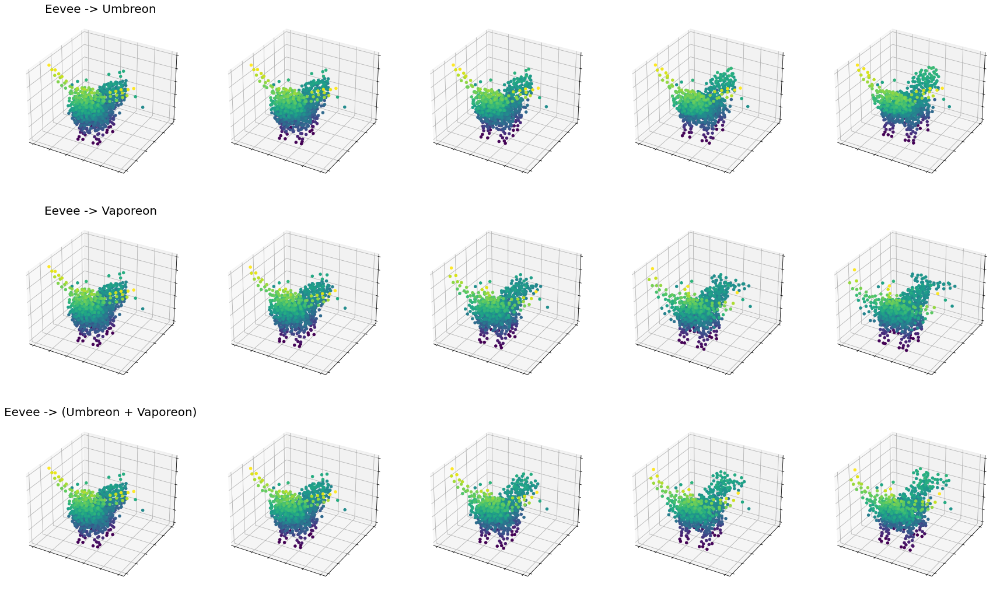

In [32]:
fig, axs = plt.subplots(3, 5, figsize=(30, 18), subplot_kw={'projection': '3d'})  
axs[0][0].set_title('Eevee -> Umbreon',              fontsize=20)
axs[1][0].set_title('Eevee -> Vaporeon',             fontsize=20)
axs[2][0].set_title('Eevee -> (Umbreon + Vaporeon)', fontsize=20)
for i in range(5):
    plot_transition(DS_pool['Eevee'], get_tff('Eevee', 'Umbreon',               i * 0.25), axs[0][i])
    plot_transition(DS_pool['Eevee'], get_tff('Eevee', 'Vaporeon',              i * 0.25), axs[1][i])
    plot_transition(DS_pool['Eevee'], get_tff('Eevee', ['Umbreon', 'Vaporeon'], i * 0.25), axs[2][i])

As we can see, the network managed to both reconstruct the output images as expected while also having enough flexibility to get some nice shape mixtures in the process. 

In contrast, we can also take a look at coming from a very busy and noisy point cloud profile such as that of a Jolteon and see that the results are pretty similar!

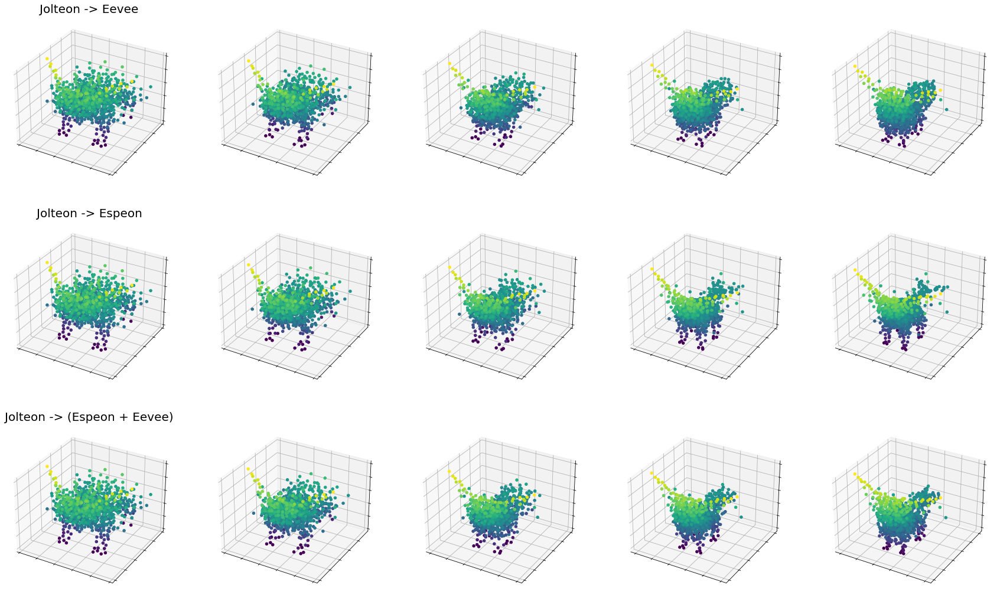

In [33]:
fig, axs = plt.subplots(3, 5, figsize=(30, 18), subplot_kw={'projection': '3d'})  
axs[0][0].set_title('Jolteon -> Eevee',            fontsize=20)
axs[1][0].set_title('Jolteon -> Espeon',           fontsize=20)
axs[2][0].set_title('Jolteon -> (Espeon + Eevee)', fontsize=20)
for i in range(5):
    plot_transition(DS_pool['Jolteon'], get_tff('Jolteon', 'Eevee',             i * 0.25), axs[0][i])
    plot_transition(DS_pool['Jolteon'], get_tff('Jolteon', 'Espeon',            i * 0.25), axs[1][i])
    plot_transition(DS_pool['Jolteon'], get_tff('Jolteon', ['Espeon', 'Eevee'], i * 0.25), axs[2][i])

#### Testing some edge cases:
- When told to map to all of the features, it gives some kind of an average which slightly different depending on the origin class.
- When told to map to none of the features, it essentially doesn't do anything and just reconstructs the original cloud, similar to when all ones are specified.   

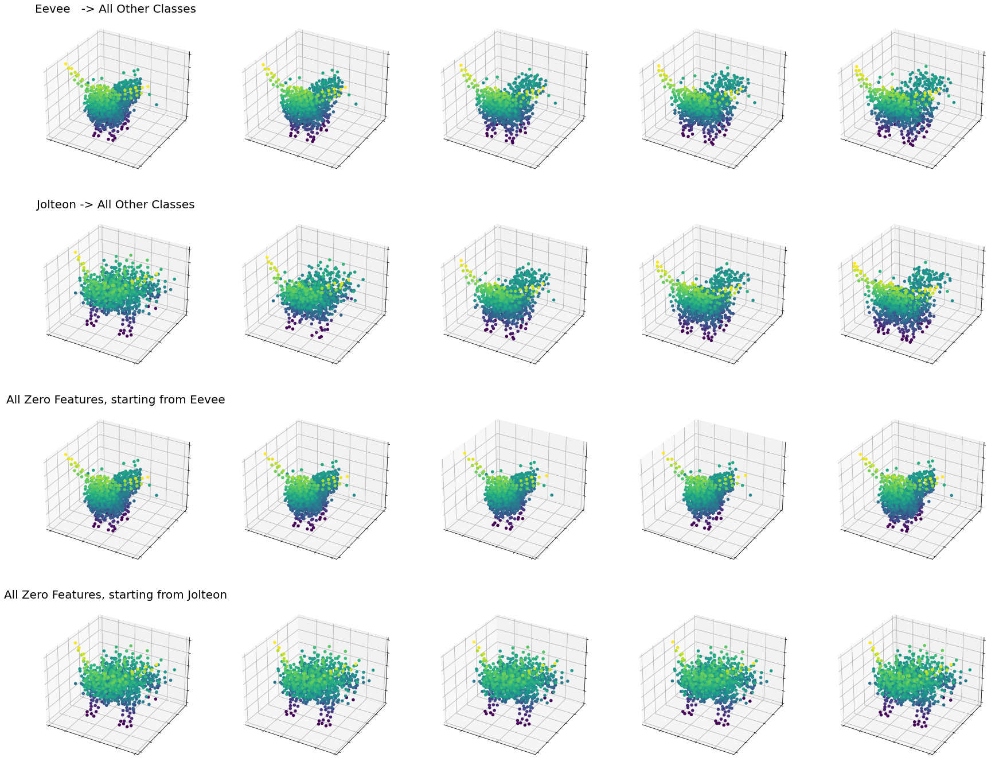

In [34]:
fig, axs = plt.subplots(4, 5, figsize=(30, 24), subplot_kw={'projection': '3d'})  
axs[0][0].set_title('Eevee   -> All Other Classes', fontsize=20)
axs[1][0].set_title('Jolteon -> All Other Classes', fontsize=20)
axs[2][0].set_title('All Zero Features, starting from Eevee', fontsize=20)
axs[3][0].set_title('All Zero Features, starting from Jolteon', fontsize=20)
for i in range(5):
    plot_transition(DS_pool['Eevee'],   get_tff('Eevee',   [v for v in vox_dict.keys() if v != 'Eevee'],   i * 0.25), axs[0][i])
    plot_transition(DS_pool['Jolteon'], get_tff('Jolteon', [v for v in vox_dict.keys() if v != 'Jolteon'], i * 0.25), axs[1][i])
    plot_transition(DS_pool['Eevee'],   get_tff(list(vox_dict.keys()), [], i * 0.25), axs[2][i])
    plot_transition(DS_pool['Jolteon'], get_tff(list(vox_dict.keys()), [], i * 0.25), axs[3][i])

Lastly, I wanted to see what would happen if we changed the input point cloud class while keeping the transformation vector the same. As we can see, the end result actually did deviate based on the sample input; the tail varied slightly based on the origin point cloud, and the jolteon origin point cloud resulted in a very jolteon-like result. 

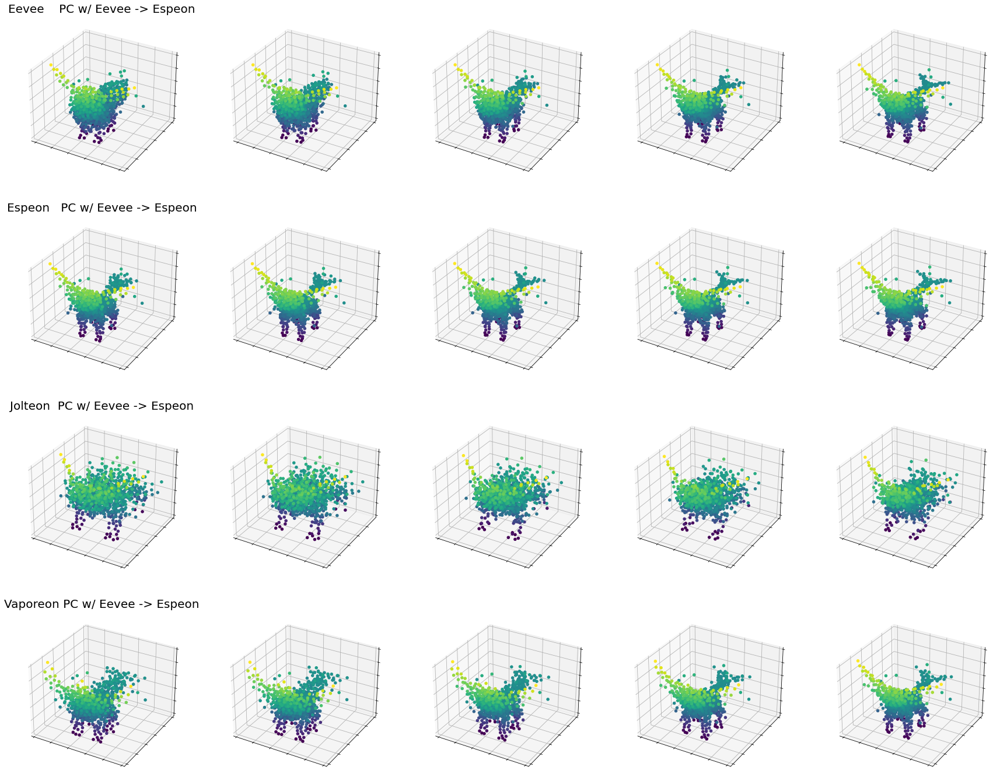

In [35]:
fig, axs = plt.subplots(4, 5, figsize=(30, 24), subplot_kw={'projection': '3d'})  
axs[0][0].set_title('Eevee    PC w/ Eevee -> Espeon', fontsize=20)
axs[1][0].set_title('Espeon   PC w/ Eevee -> Espeon', fontsize=20)
axs[2][0].set_title('Jolteon  PC w/ Eevee -> Espeon', fontsize=20)
axs[3][0].set_title('Vaporeon PC w/ Eevee -> Espeon', fontsize=20)

for i in range(5):
    plot_transition(DS_pool['Eevee'],    get_tff('Eevee', 'Espeon', i * 0.25), axs[0][i])
    plot_transition(DS_pool['Espeon'],   get_tff('Eevee', 'Espeon', i * 0.25), axs[1][i])
    plot_transition(DS_pool['Jolteon'],  get_tff('Eevee', 'Espeon', i * 0.25), axs[2][i])    
    plot_transition(DS_pool['Vaporeon'], get_tff('Eevee', 'Espeon', i * 0.25), axs[3][i])

## Challenges During Implementation

Throughout this experiment, multiple difficulties stifled progress. Since this is supposed to be a discussion of how it went along, I thought it would be useful to include this discussion.

- When originally trying to implement the paper code, I got a bit sidetracked in objective and spend a good amount of time trying to replicate the results. In hindsight, this somewhat defeats the "starter project" point where I'm just trying to get something cool to happen and show.
- I tried experimenting with some deeper models (i.e. with deeper conv + dense components with >20M params). This ended up being kinda pointless and also caused my computer to crash on occasion. It was for that reason why the logger/checkpoint system was implemented as it was; because tf would just crash without any indication sometimes. 
- In hindsight, implementing the VAE wasn't very useful. I don't particularly regret it though, as I was curious and did have some fun getting it all straightened out.
- Getting started was a bit weird because I had to find out how to properly deal with 3D elements in Python while keeping with the M1 hardware limitations. I got lucky and stumbled on PyMesh pretty early on, but I tried a bunch of things before that which would error at some point down the installation only to find out that it was incompatable. 
- There was some intuition from the paper that was a bit different than what I was used to. The fact that the sampled points don't have a sense local associability made it difficult to apply the logic I've build up relating to image processing where the pixel proximity makes a difference and is handled with convolutions. In hindsight, it really wasn't that different, and was pretty fun to explore. 

## Main References

- [Learning Representations and Generative Models for 3D Point Clouds (Panos Achlioptas et. al.)](https://arxiv.org/abs/1707.02392)
- [Generative Deep Learning with TensorFlow (Coursera; DeepLearning.AI)](https://www.coursera.org/learn/generative-deep-learning-with-tensorflow)
- [Build Basic Generative Adversarial Networks (Coursera; DeepLearning.AI)](https://www.coursera.org/learn/build-basic-generative-adversarial-networks-gans)
- Additional implementation-level references documented alongside code. 

In [2]:
%%html
<script src="https://ajax.googleapis.com/ajax/libs/jquery/3.5.1/jquery.min.js"></script>

In [3]:
%%javascript
$('div.jp-InputArea-editor').toggle();
$('div.jp-InputPrompt').click(function(e){
    $(this).parent().find('div.jp-InputArea-editor').toggle();
});
$('body.jp-Notebook').css('width', '80%');
$('body.jp-Notebook').css('margin', '5% 10%');

<IPython.core.display.Javascript object>